In [5]:
import pandera as pa
import geopandas as gpd
from shapely import Point, MultiPoint, Polygon, MultiPolygon, LineString, MultiLineString
from pandera.typing import Series, Index
from pandera.typing.geopandas import GeoSeries


class BaseSchema(pa.DataFrameModel):
    idx: Index[int] = pa.Field(unique=True)
    geometry: GeoSeries
    _geom_types = [Point, MultiPoint, Polygon, MultiPolygon, LineString, MultiLineString]

    class Config:
        strict = "filter"
        add_missing_columns = True

    @classmethod
    def to_gdf(cls):
        columns = cls.to_schema().columns.keys()
        return gpd.GeoDataFrame(data=[], columns=columns, crs=4326)

    @pa.check("geometry")
    @classmethod
    def check_geometry(cls, series):
        return series.map(lambda x: any([isinstance(x, geom_type) for geom_type in cls._geom_types]))

In [6]:
import pandera as pa
import pandas as pd
import geopandas as gpd
import shapely
from tqdm import tqdm

class SettlementsSchema(BaseSchema):
  _geom_types = [shapely.Point]

  @pa.parser('geometry')
  @classmethod
  def parse_geometry(cls, series):
    name = series.name
    return series.representative_point().rename(name)

class UnitsSchema(BaseSchema):
  _geom_types = [shapely.Polygon, shapely.MultiPolygon]

class Voronizer():

  def __init__(self, settlements_gdf : gpd.GeoDataFrame, units_gdf : gpd.GeoDataFrame):
    self.global_crs = settlements_gdf.crs
    self.local_crs = settlements_gdf.estimate_utm_crs()

    self.settlements_gdf = SettlementsSchema(settlements_gdf.to_crs(self.local_crs))
    # units_gdf = units_gdf.explode(index_parts = True).reset_index().copy()
    self.units_gdf = UnitsSchema(units_gdf.to_crs(self.local_crs))

  def run(self):
    #polygonize every unit settlements
    settlements_gdf = self.settlements_gdf[['geometry']].copy()
    units_gdf = self.units_gdf[['geometry']].copy()
    sjoin = settlements_gdf.sjoin(units_gdf, how='left', predicate='within')
    voronoi_gdfs = []
    for unit_i, unit_settlements_gdf in tqdm(sjoin.groupby('index_right')):
      unit_polygon = units_gdf.loc[unit_i].geometry
      voronoi_geoseries = unit_settlements_gdf.geometry.voronoi_polygons(extend_to=unit_polygon)
      voronoi_gdf = gpd.GeoDataFrame(geometry=voronoi_geoseries.clip(unit_polygon))
      voronoi_gdfs.append(voronoi_gdf)
    #concat resulting gdf
    gdf = pd.concat(voronoi_gdfs).reset_index(drop=True)[['geometry']]
    sjoin = settlements_gdf.sjoin(gdf, predicate='within')
    sjoin.geometry = sjoin['index_right'].apply(lambda ir : gdf.loc[ir].geometry)
    return gdf

In [3]:
import os
import requests
import pandas as pd
import geopandas as gpd
import numpy as np
import pickle
from loguru import logger

from popframe.preprocessing.level_filler import LevelFiller
from popframe.models.region import Region
from idu_clients import UrbanAPI

URBAN_API = 'http://10.32.1.107:5300'
POPULATION_COUNT_INDICATOR_ID = 1
DEFAULT_CRS = 4326

def get_territories_population(territories_gdf : gpd.GeoDataFrame):
    res = requests.get(f'{URBAN_API}/api/v1/indicator/{POPULATION_COUNT_INDICATOR_ID}/values')
    res_df = pd.DataFrame(res.json())
    res_df = res_df[res_df['territory_id'].isin(territories_gdf.index)]
    res_df = res_df.groupby('territory_id').agg({'value': 'last'}).rename(columns={'value':'population'})
    return territories_gdf[['geometry', 'name']].merge(res_df, left_index=True, right_index=True)

def get_country_regions(country_id : int) -> pd.DataFrame:
    res = requests.get(f'{URBAN_API}/api/v1/all_territories', {
        'parent_id':country_id
    })
    return gpd.GeoDataFrame.from_features(res.json()['features'], crs=DEFAULT_CRS).set_index('territory_id', drop=True)

def get_countries_without_geometry() -> pd.DataFrame:
    res = requests.get(f'{URBAN_API}/api/v1/all_territories_without_geometry')
    return pd.DataFrame(res.json()).set_index('territory_id', drop=True)

def get_regions():
    countries = get_countries_without_geometry()
    countries_ids = countries.index
    countries_regions = [get_country_regions(country_id) for country_id in countries_ids]
    return pd.concat(countries_regions)


def get_territories(parent_id : int | None = None, all_levels = False, geometry : bool = False) -> pd.DataFrame | gpd.GeoDataFrame:
    res = requests.get(URBAN_API + f'/api/v1/all_territories{"" if geometry else "_without_geometry"}', {
        'parent_id': parent_id,
        'get_all_levels': all_levels
    })
    res_json = res.json()
    if geometry:
        gdf = gpd.GeoDataFrame.from_features(res_json, crs=DEFAULT_CRS)
        return gdf.set_index('territory_id', drop=True)
    df = pd.DataFrame(res_json)
    return df.set_index('territory_id', drop=True)

def load_towns(region_id: int) -> gpd.GeoDataFrame:
    territories_gdf = get_territories(region_id, all_levels = True, geometry=True)
    towns_gdf = territories_gdf[territories_gdf['is_city'] == True]
    towns_gdf['geometry'] = towns_gdf['geometry'].representative_point()
    towns_gdf = get_territories_population(towns_gdf)
    towns_gdf['id'] = towns_gdf.index
    level_filler = LevelFiller(towns=towns_gdf)
    towns = level_filler.fill_levels()
    return towns

def load_ter(region_id: int) -> gpd.GeoDataFrame:
    # Загружаем данные территорий
    territories_gdf = get_territories(region_id, all_levels=True, geometry=True)
    territories_gdf = territories_gdf[territories_gdf['is_city'] == False]
    
    # Загружаем данные региона и выбираем нужный регион
    regions = get_regions()
    region = regions.loc[[region_id]]
    
    # Объединяем region и territories_gdf
    combined_gdf = gpd.GeoDataFrame(pd.concat([region, territories_gdf], ignore_index=True))
    
    return combined_gdf

In [4]:
# REGIONS_DICT = {
#   1: 'Ленинградская область',
  # 3138: 'Санкт-Петербург',
  # 3268: 'Москва',
  # 3427: 'Волгоградская область',
  # 3902: 'Тульская область',
  # 4013: 'Омская область',
  # 4437: 'Краснодарский край',
  # 4882: 'Тюменская область',
  # 5188: 'Московская область',
# }


In [11]:
region_id = 5188
territories = load_ter(region_id)
territories

,geometry,territory_type,parent_id,name,level,properties,admin_center,okato_code,oktmo_code,is_city,created_at,updated_at
0,"POLYGON ((35.1485 55.9575, 35.14878 55.95714, ...","{'territory_type_id': 1, 'name': 'Субъект Феде...",12639,Московская область,2,"{'Малые города': 99, 'Крупные города': 1, 'Вуз...",None,46000000000,None,False,2024-06-16T21:35:40.801621Z,2024-06-16T21:35:40.801621Z
1,"POLYGON ((37.77607 55.87273, 37.77666 55.86553...","{'territory_type_id': 2, 'name': 'Муниципально...",5188,Балашиха,3,"{'Малые города': 0, 'Крупные города': 1, 'Площ...",None,46404000000,46704000,False,2024-06-16T21:35:40.801621Z,2024-11-11T09:56:16.901666Z
2,"POLYGON ((38.05194 55.77862, 38.05258 55.7769,...","{'territory_type_id': 2, 'name': 'Муниципально...",5188,Богородский,3,"{'Малые города': 4, 'Крупные города': 0, 'Площ...",None,46428000081,46751000,False,2024-06-16T21:35:40.801621Z,2024-11-11T09:56:17.864739Z
3,"POLYGON ((38.19609 55.43117, 38.19627 55.42981...","{'territory_type_id': 2, 'name': 'Муниципально...",5188,Бронницы,3,"{'Малые города': 0, 'Крупные города': 0, 'Площ...",None,46405000000,46705000,False,2024-06-16T21:35:40.801621Z,2024-11-11T09:56:22.992329Z
4,"POLYGON ((37.16482 55.67983, 37.16516 55.67945...","{'territory_type_id': 2, 'name': 'Муниципально...",5188,Власиха,3,"{'Малые города': 1, 'Крупные города': 0, 'Площ...",None,46573000000,46773000,False,2024-06-16T21:35:40.801621Z,2024-11-11T09:56:23.885811Z
...,...,...,...,...,...,...,...,...,...,...,...,...
56,"POLYGON ((35.1485 55.9575, 35.14878 55.95714, ...","{'territory_type_id': 2, 'name': 'Муниципально...",5188,Шаховская,3,"{'Малые города': 1, 'Крупные города': 0, 'Площ...",None,46487000000,46787000,False,2024-06-16T21:35:40.801621Z,2024-11-11T09:57:01.389236Z
57,"POLYGON ((37.89602 55.93496, 37.89666 55.93483...","{'territory_type_id': 2, 'name': 'Муниципально...",5188,Щелково,3,"{'Малые города': 3, 'Крупные города': 0, 'Площ...",None,46488000000,46788000,False,2024-06-16T21:35:40.801621Z,2024-11-11T09:56:10.958126Z
58,"POLYGON ((38.79277 55.85058, 38.72773 55.84975...","{'territory_type_id': 2, 'name': 'Муниципально...",5188,Электрогорск,3,"{'Малые города': 1, 'Крупные города': 0, 'Площ...",None,46459000000,46791000,False,2024-06-16T21:35:40.801621Z,2024-11-11T09:56:12.028145Z
59,"POLYGON ((38.32787 55.77795, 38.32801 55.77765...","{'territory_type_id': 2, 'name': 'Муниципально...",5188,Электросталь,3,"{'Малые города': 0, 'Крупные города': 0, 'Площ...",None,46490000000,46790000,False,2024-06-16T21:35:40.801621Z,2024-11-11T09:57:02.473798Z


In [13]:
geometry_types = territories.geom_type.value_counts()
print(geometry_types)

Polygon    61
dtype: int64


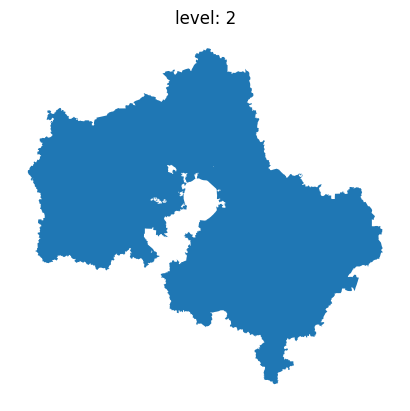

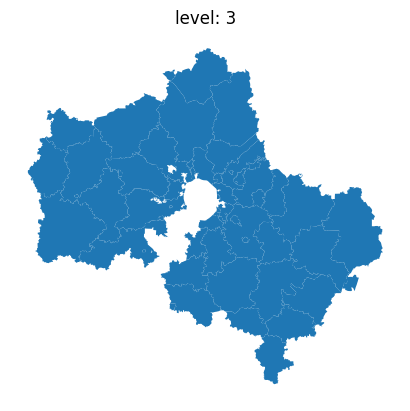

In [14]:
import matplotlib.pyplot as plt

for level, gdf_level in territories.groupby('level'):
    ax = gdf_level.plot()
    ax.set_title(f'level: {level}')
    ax.set_axis_off()
    plt.show()  

In [10]:
geometry_types = territories[territories['level'] == 3].geom_type.value_counts()
print(geometry_types)

MultiPolygon    12
dtype: int64


In [17]:
# Преобразуем значения в столбце 'territory_type' в строки
territories['territory_type'] = territories['territory_type'].apply(lambda x: str(x) if isinstance(x, dict) else x)

# Теперь можем получить уникальные значения
un = territories[territories['level'] == 3]['territory_type'].unique()
print(un)

["{'territory_type_id': 2, 'name': 'Муниципальное образование'}"]


In [18]:
un2 =  territories[territories['level'] == 3]['territory_type'].value_counts()
un2

{'territory_type_id': 2, 'name': 'Муниципальное образование'}    60
Name: territory_type, dtype: int64

In [16]:
territories[territories['level'] == 3].explore()

In [22]:
territories[territories['name']=='Электрогорск']

,geometry,territory_type,parent_id,name,level,properties,admin_center,okato_code,oktmo_code,is_city,created_at,updated_at
58,"POLYGON ((38.79277 55.85058, 38.72773 55.84975...","{'territory_type_id': 2, 'name': 'Муниципально...",5188,Электрогорск,3,"{'Малые города': 1, 'Крупные города': 0, 'Площ...",None,46459000000,46791000,False,2024-06-16T21:35:40.801621Z,2024-11-11T09:56:12.028145Z


In [82]:
import geopandas as gpd
import pandas as pd


level_2 = territories[territories['level'] == 2]
level_3 = territories[territories['level'] == 3]
level_4 = territories[territories['level'] == 4]

if not level_2.empty and not level_3.empty:
    level_2_cleaned = gpd.overlay(level_2, level_3, how='difference', keep_geom_type=False)
else:
    level_2_cleaned = level_2

if not level_2_cleaned.empty and not level_4.empty:
    level_2_cleaned = gpd.overlay(level_2_cleaned, level_4, how='difference', keep_geom_type=False)

if not level_3.empty and not level_4.empty:
    level_3_cleaned = gpd.overlay(level_3, level_4, how='difference', keep_geom_type=False)
else:
    level_3_cleaned = level_3

territories_cleaned = gpd.GeoDataFrame(
    pd.concat([level_2_cleaned, level_3_cleaned, level_4], ignore_index=True)
).set_crs(territories.crs)

territories_cleaned = territories_cleaned[
    territories_cleaned.geom_type.isin(["Polygon", "MultiPolygon"])
]

territories_cleaned






,geometry,territory_type,parent_id,name,level,properties,admin_center,okato_code,oktmo_code,is_city,created_at,updated_at
0,"MULTIPOLYGON (((37.37472 55.8916, 37.37485 55....","{'territory_type_id': 1, 'name': 'Субъект Феде...",12639,Московская область,2,"{'Малые города': 99, 'Крупные города': 1, 'Вуз...",None,46000000000,None,False,2024-06-16T21:35:40.801621Z,2024-06-16T21:35:40.801621Z
1,"POLYGON ((37.77607 55.87273, 37.77666 55.86553...","{'territory_type_id': 2, 'name': 'Муниципально...",5188,Балашиха,3,"{'Малые города': 0, 'Крупные города': 1, 'Площ...",None,46404000000,46704000,False,2024-06-16T21:35:40.801621Z,2024-11-11T09:56:16.901666Z
2,"POLYGON ((38.05194 55.77862, 38.05258 55.7769,...","{'territory_type_id': 2, 'name': 'Муниципально...",5188,Богородский,3,"{'Малые города': 4, 'Крупные города': 0, 'Площ...",None,46428000081,46751000,False,2024-06-16T21:35:40.801621Z,2024-11-11T09:56:17.864739Z
3,"POLYGON ((38.19609 55.43117, 38.19627 55.42981...","{'territory_type_id': 2, 'name': 'Муниципально...",5188,Бронницы,3,"{'Малые города': 0, 'Крупные города': 0, 'Площ...",None,46405000000,46705000,False,2024-06-16T21:35:40.801621Z,2024-11-11T09:56:22.992329Z
4,"POLYGON ((37.16482 55.67983, 37.16516 55.67945...","{'territory_type_id': 2, 'name': 'Муниципально...",5188,Власиха,3,"{'Малые города': 1, 'Крупные города': 0, 'Площ...",None,46573000000,46773000,False,2024-06-16T21:35:40.801621Z,2024-11-11T09:56:23.885811Z
...,...,...,...,...,...,...,...,...,...,...,...,...
56,"POLYGON ((35.1485 55.9575, 35.14878 55.95714, ...","{'territory_type_id': 2, 'name': 'Муниципально...",5188,Шаховская,3,"{'Малые города': 1, 'Крупные города': 0, 'Площ...",None,46487000000,46787000,False,2024-06-16T21:35:40.801621Z,2024-11-11T09:57:01.389236Z
57,"POLYGON ((37.89602 55.93496, 37.89666 55.93483...","{'territory_type_id': 2, 'name': 'Муниципально...",5188,Щелково,3,"{'Малые города': 3, 'Крупные города': 0, 'Площ...",None,46488000000,46788000,False,2024-06-16T21:35:40.801621Z,2024-11-11T09:56:10.958126Z
58,"POLYGON ((38.79277 55.85058, 38.72773 55.84975...","{'territory_type_id': 2, 'name': 'Муниципально...",5188,Электрогорск,3,"{'Малые города': 1, 'Крупные города': 0, 'Площ...",None,46459000000,46791000,False,2024-06-16T21:35:40.801621Z,2024-11-11T09:56:12.028145Z
59,"POLYGON ((38.32787 55.77795, 38.32801 55.77765...","{'territory_type_id': 2, 'name': 'Муниципально...",5188,Электросталь,3,"{'Малые города': 0, 'Крупные города': 0, 'Площ...",None,46490000000,46790000,False,2024-06-16T21:35:40.801621Z,2024-11-11T09:57:02.473798Z


In [94]:
territories_cleaned.explore()

In [58]:
# from popframe.method.popuation_frame import PopulationFrame
# from popframe.models.region import Region
# # region_model = Region.from_pickle('C:\Code\PopFrame\Ленинградская область.pickle')
# region_model = Region.from_pickle('data/1.pickle')
# settlements = region_model.get_towns_gdf()
# settlements

,id,name,population,level,geometry
207,207,Болото,10,Малое сельское поселение,POINT (543142.343 6580637.216)
208,208,Большой Остров,68,Малое сельское поселение,POINT (544532.933 6593227.683)
209,209,Бор,1734,Большое сельское поселение,POINT (544895.406 6593052.346)
210,210,Бороватое,10,Малое сельское поселение,POINT (543993.115 6589581.591)
211,211,Бочево,10,Малое сельское поселение,POINT (538540.114 6576793.156)
...,...,...,...,...,...
3133,3133,Апраксин Бор,313,Среднее сельское поселение,POINT (399059.733 6560340.947)
3134,3134,Александровка,313,Среднее сельское поселение,POINT (403967.163 6562086.557)
3135,3135,Большая Горка,313,Среднее сельское поселение,POINT (413116.733 6573792.753)
3136,3136,Дроздово,5,Малое сельское поселение,POINT (412458.024 6574810.78)


In [75]:
settlements = gpd.read_file('data/5188_towns.geojson')
settlements

,name,population,geometry
0,Серебряные Пруды,9358,POINT (38.72237 54.46798)
1,Узуново,3417,POINT (38.61833 54.54061)
2,Благодать,52,POINT (38.62932 54.47175)
3,Ступино,66463,POINT (38.07726 54.8866)
4,Кашира,39929,POINT (38.15051 54.83745)
...,...,...,...
2821,Шелгуново,9,POINT (35.60816 56.37178)
2822,Мазлово,2,POINT (35.68766 56.36313)
2823,Себудово,2,POINT (35.52194 56.3725)
2824,Введенское,694,POINT (35.63585 56.37377)


In [76]:
settlements.explore()

In [7]:
region_id = 1
settlements = load_towns(region_id)
settlements

/Users/mvin/Code/PopFrame/.venv/lib/python3.10/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


KeyError: 'territory_id'

In [77]:
voronizer = Voronizer(settlements, territories_cleaned)
voronoi_settlements = voronizer.run()
voronoi_settlements

100%|██████████| 60/60 [00:00<00:00, 111.52it/s]


,geometry
0,"POLYGON ((435074.763 6178587.986, 443249.885 6..."
1,"POLYGON ((435074.763 6178587.986, 436648.572 6..."
2,"POLYGON ((436648.572 6180604.233, 435074.763 6..."
3,"POLYGON ((436648.572 6180604.233, 439817.531 6..."
4,"POLYGON ((454466.82 6176954.76, 459586.412 617..."
...,...
2816,"POLYGON ((463305.76 6175510.527, 468150.05 617..."
2817,"POLYGON ((463305.76 6175510.527, 463142.132 61..."
2818,"POLYGON ((468470.917 6179321.407, 468305.167 6..."
2819,"POLYGON ((459118.298 6182399.081, 459162.203 6..."


In [62]:
# voronoi_settlements.to_file('voronoi_settlements_1.geojson')

In [78]:
# Отображаем первый слой (settlements) через explore
m = settlements.explore()  # Выбираем цвет и добавляем подсказку по названию

# Добавляем второй слой (voronoi_settlements) к той же карте
voronoi_settlements.explore(m=m)  # Используем ту же карту (m) и выбираем другой цвет

m  # Отображаем карту